In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import subprocess

In [2]:
# Run the data generation script
subprocess.run(["g++", "-o", "fourier", "fourier.cpp", "-lm"])
subprocess.run(["./fourier"])

CompletedProcess(args=['./fourier'], returncode=0)

In [3]:
csv_file = []
for file in os.listdir("fourier_data"):
    if file.endswith(".csv"):
        csv_file.append(file)
        print(file)


alternative_kalman1.csv
alternative_kalman2.csv
extended_kalman1.csv
extended_kalman2.csv
inverted_trajectory_component.csv
inverted_trajectory_position.csv
kalman1.csv
kalman2.csv
LQR1.csv
LQR2.csv
luenberger1.csv
luenberger2.csv
PID1.csv
PID2.csv
trajectory_component.csv
trajectory_position.csv


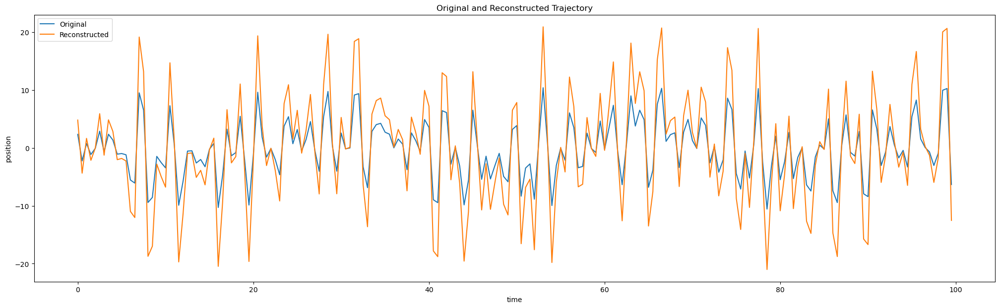

In [4]:
trajectory = pd.read_csv("fourier_data/trajectory_position.csv")
inverted_trajectory = pd.read_csv("fourier_data/inverted_trajectory_position.csv")

# plot in a figure size x=25, y=7
fig = plt.figure(figsize=(25, 7))
plt.plot(trajectory["time"], trajectory["position"])
plt.plot(inverted_trajectory["time"], inverted_trajectory["position"])
plt.xlabel("time")
plt.ylabel("position")
plt.title("Original and Reconstructed Trajectory")
plt.legend(["Original", "Reconstructed"])
plt.show()

In [5]:
# Combine trajectory and inverted trajectory dataframes with unique headers
trajectory_component = pd.read_csv("fourier_data/trajectory_component.csv")
inverted_trajectory_component = pd.read_csv("fourier_data/inverted_trajectory_component.csv")

# convert to table
trajectory_component = trajectory_component.pivot_table(index="n", values=["angular_velocity", "amplitude", "phase"])
inverted_trajectory_component = inverted_trajectory_component.pivot_table(index="n", values=["angular_velocity", "amplitude", "phase"])

trajectory_component

,amplitude,angular_velocity,phase
n,,,
0,0.597150,3.219390,3.31753
1,0.657307,-9.327140,2.12455
2,0.330886,-3.869840,4.89726
3,2.511230,-9.272050,1.53147
4,0.647761,8.529850,6.14594
5,3.430450,2.344120,7.88009
6,3.820540,-3.843430,9.00201
7,2.657370,0.178391,7.17590
8,1.122320,-5.281840,6.26719


In [6]:
inverted_trajectory_component

,amplitude,angular_velocity,phase
n,,,
0,0.255361,0.000000,3.141590
1,0.642620,0.062832,3.115260
2,1.157670,0.125664,-2.806750
3,4.533110,0.188496,0.439860
4,0.539600,0.251327,1.159860
5,0.324551,0.314159,0.483943
6,0.187105,0.376991,-1.431060
7,0.159909,0.439823,1.665080
8,0.163189,0.502655,1.272430


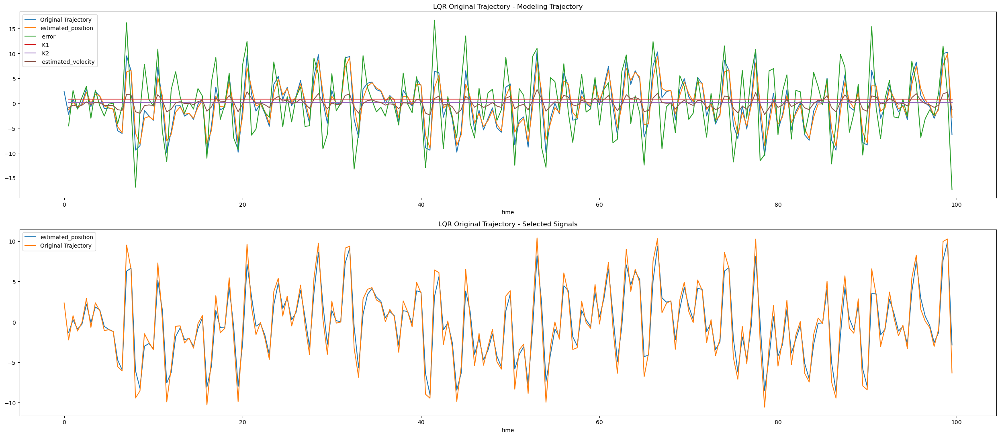

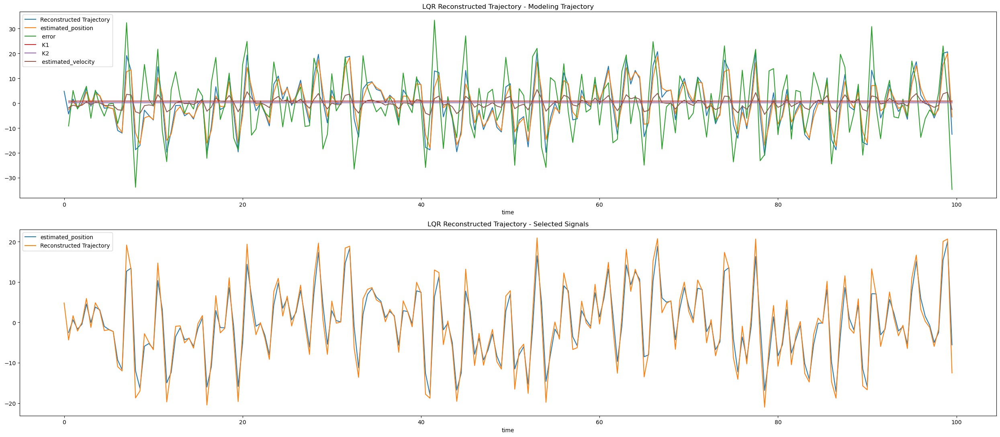

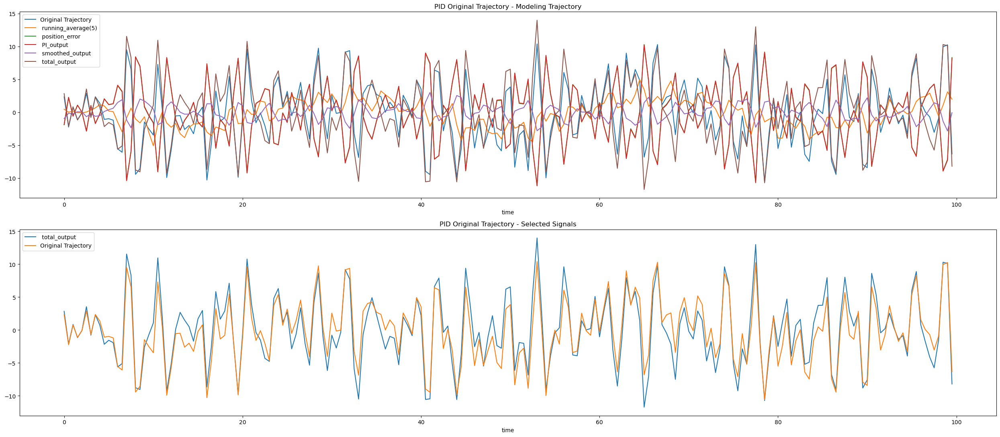

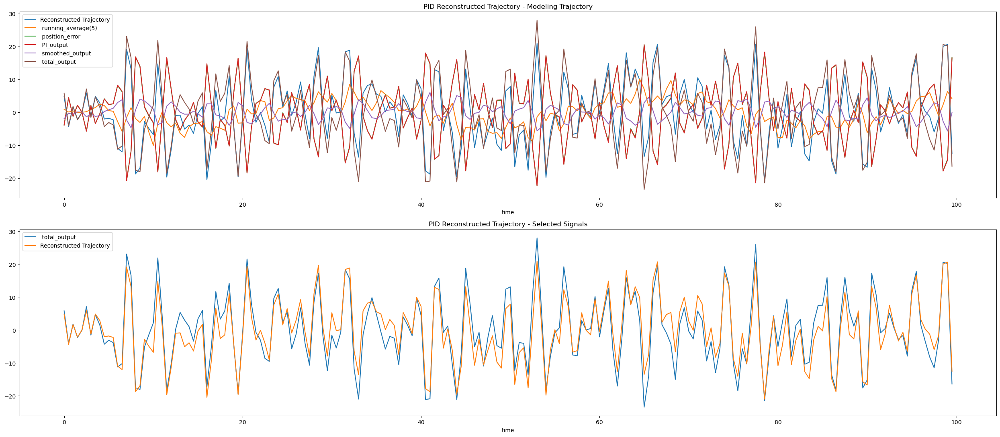

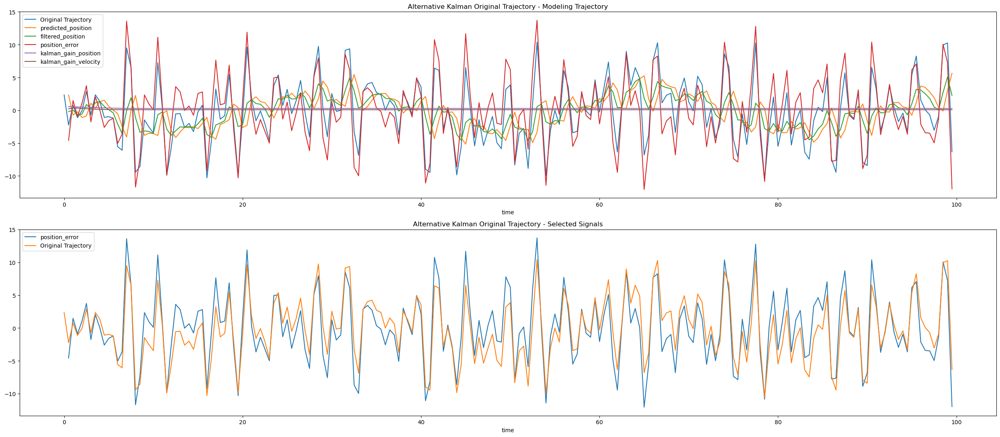

...

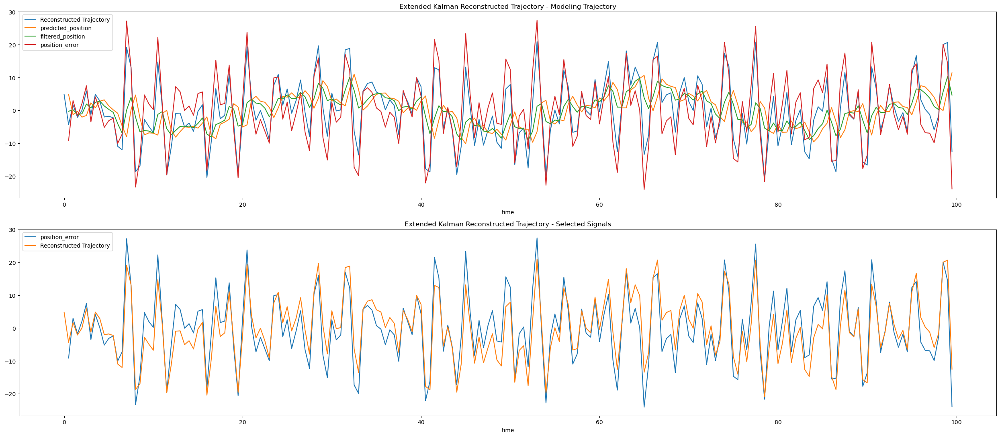

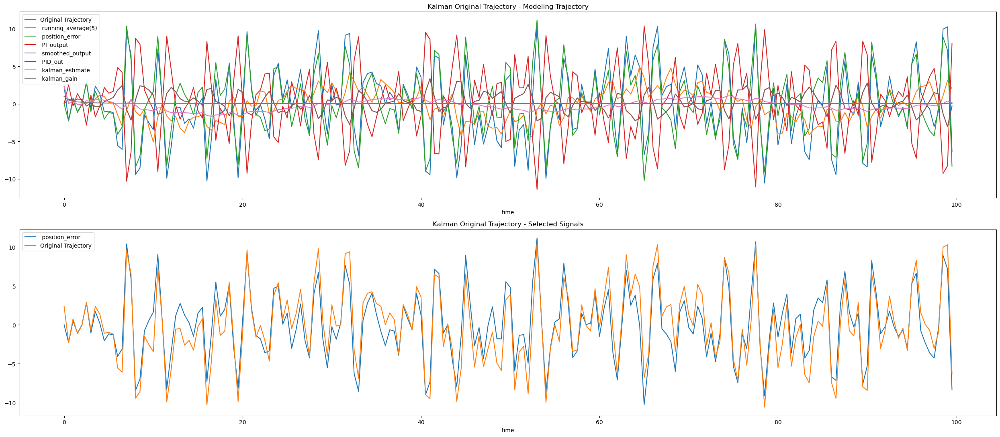

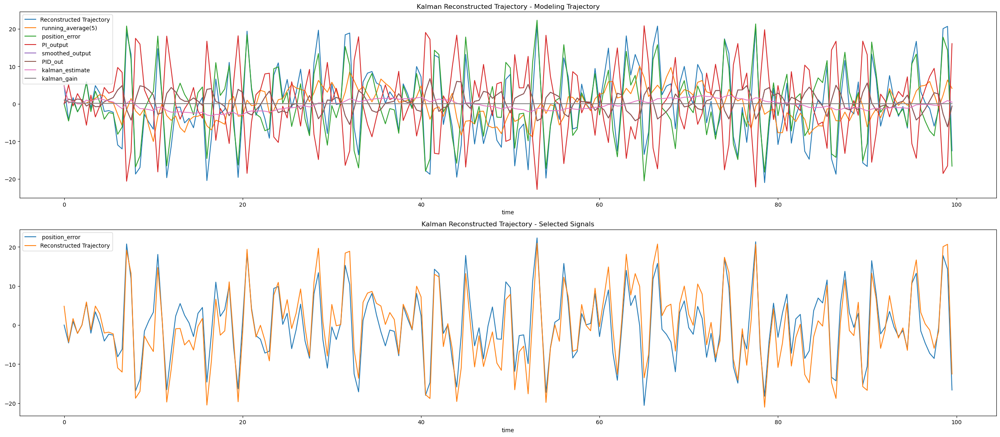

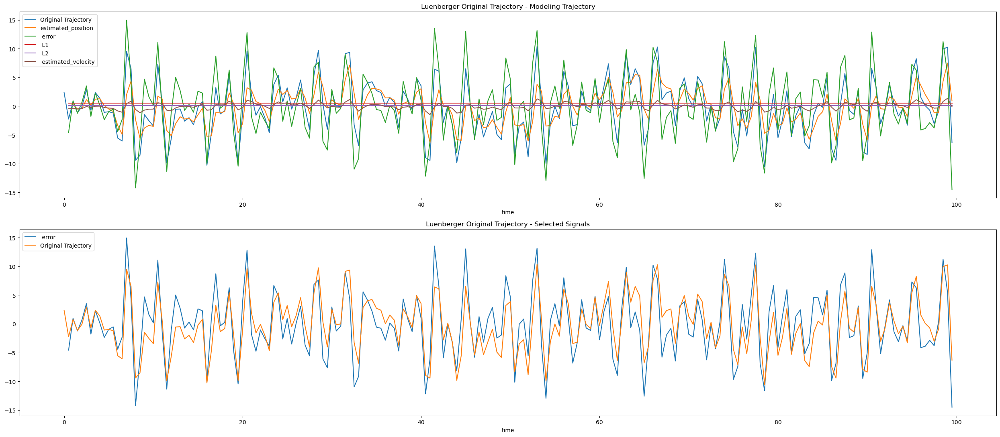

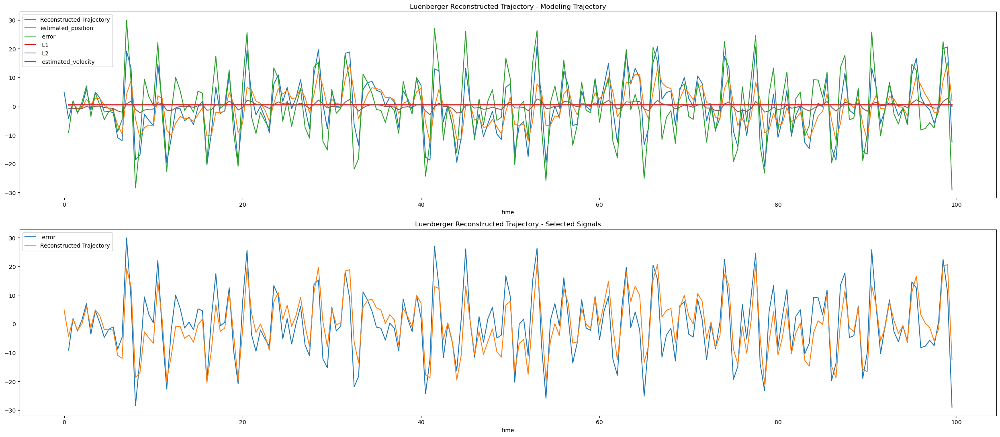

In [7]:
for file in sorted(csv_file):
    if file.endswith("_component.csv") or file.endswith("_position.csv"):
        continue

    df = pd.read_csv("fourier_data/" + file)
    headers = list(df.columns)[1:]

    has_measured = "measured_position" in headers
    if has_measured:
        headers.remove("measured_position")
    
    # Title formatting
    terms = file.split(".")[0].split("_")
    title = " ".join(terms)
    last_char = title[-1]
    title = title[:-1]
    if not (title == 'PID' or title == 'LQR'):
        title = title.title()

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(figsize=(25, 11), ncols=1, nrows=2)

    # Subplot 1: Full trajectory and model estimates
    if last_char == "1":
        ax1.plot(trajectory["time"], trajectory["position"], label="Original Trajectory")
        title += " Original Trajectory"
    elif last_char == "2":
        ax1.plot(inverted_trajectory["time"], inverted_trajectory["position"], label="Reconstructed Trajectory")
        title += " Reconstructed Trajectory"

    for header in headers:
        ax1.plot(df["time"], df[header], label=header)

    ax1.set_xlabel("time")
    ax1.set_title(title + " - Modeling Trajectory")
    ax1.legend(loc="upper left")

    # Subplot 2: Selected signal(s)
    selected_headers = []
    if "PID" in title:
        selected_headers = [col for col in df.columns if "total_output" in col]
    elif "Kalman" in title:
        selected_headers = [col for col in df.columns if "error" in col]
    elif "LQR" in title:
        selected_headers = [col for col in df.columns if any(k in col for k in ["estimated_position"])]
    elif "Luenberger" in title:
        selected_headers = [col for col in df.columns if any(k in col for k in ["error"])]

    for header in selected_headers:
        ax2.plot(df["time"], df[header], label=header)

    if last_char == "1":
        ax2.plot(trajectory["time"], trajectory["position"], label="Original Trajectory")
    elif last_char == "2":
        ax2.plot(inverted_trajectory["time"], inverted_trajectory["position"], label="Reconstructed Trajectory")

    ax2.set_xlabel("time")
    ax2.set_title(title + " - Selected Signals")
    ax2.legend(loc="upper left")

    # Layout and show
    plt.tight_layout()
    plt.show()
